## Merchant churn prediction

### Data: 

The dataset has future merchant transaction activity, for merchants that start over a 2-year period (2033-2034). The data spans from 1/1/33 through 12/31/34. Although the data is made up, you can consider this to be a random sample of future merchants. Each observation is a transaction amount in cents. If the merchant stops processing, then they would no longer appear.  


### Questions:

 - We have limited data on these merchants and their transactions, but we are still interested in understanding their payments activity to try to infer the types of merchants. Using only the given data, how would you identify different kinds of businesses in the sample? Please generate assignments for each merchant.

 - Sometimes a merchant may stop processing, which we call churn. We are interested in identifying and predicting churn. Please a) come up with a concrete definition for churn b) identify merchants that have already churned in the dataset, and c) build a model to predict which active merchants are most likely to churn in the near future.
 

In [1]:
#Import required libraries:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import datetime
from yellowbrick.cluster import InterclusterDistance, KElbowVisualizer, SilhouetteVisualizer
import sklearn
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score, confusion_matrix, auc, precision_score, recall_score, roc_curve, f1_score, fbeta_score, roc_auc_score, classification_report
from sklearn import preprocessing
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LogisticRegression  
from sklearn.neighbors import KNeighborsClassifier  
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn import model_selection
from imblearn.combine import SMOTETomek
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import plotly
import plotly.express as px

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=FutureWarning) 
warnings.filterwarnings("ignore", category=UserWarning) 

%matplotlib inline

## Part 1: Clustering - generate label assignments for each merchant

### Read in data

In [2]:
# Read the data:
data = pd.read_csv("merchant.csv")
data.head()

,Unnamed: 0,merchant,time,amount_usd_in_cents
0,1,faa029c6b0,2034-06-17 23:34:14,6349
1,2,ed7a7d91aa,2034-12-27 00:40:38,3854
2,3,5608f200cf,2034-04-30 01:29:42,789
3,4,15b1a0d61e,2034-09-16 01:06:23,4452
4,5,4770051790,2034-07-22 16:21:42,20203


In [3]:
# drop unused column, convert time to datetime, and change cents to dollar unit for easy understanding
data.drop('Unnamed: 0', axis=1, inplace=True)
data['time'] = pd.to_datetime(data['time'])
data['amount_usd_in_dollars'] = data['amount_usd_in_cents']/100

### Data Preprocessing

In [4]:
# number of unique merchant
print(len(data), len(data.merchant.unique()))

1513719 14351


We have 14,351 merchants out of total 1,513,719 transactions. 

Next we want to check the transaction distributions. We choose to plot the first 4 merchants' transaction histograms. 

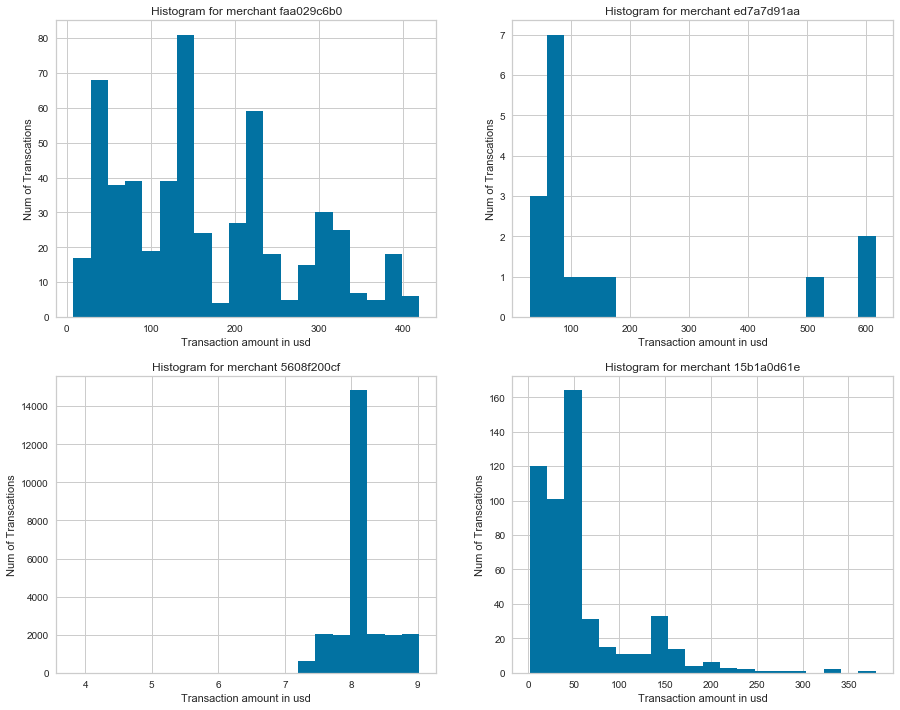

In [5]:
# check transaction distributions for the first four merchants
plt.figure(figsize=(15, 12))

for i in range(4):
    one_merchant = data.loc[data['merchant'] == data['merchant'].unique()[i]]
    
    # set up the plot
    ax = plt.subplot(2, 2, i + 1)
    
    # draw the plot
    ax.hist(one_merchant['amount_usd_in_dollars'], bins = 20)
    
    # title and labels
    ax.set_title('Histogram for merchant {}'.format(data['merchant'].unique()[i]))
    ax.set_xlabel('Transaction amount in usd')
    ax.set_ylabel('Num of Transcations')


Histograms show that transaction distributions are skewed (not symmetrical). In this case, we want to use median (instead of mean) as a more accurate measure of central tendency. 

In [6]:
# percentage of merchants only had one transaction
sum(data.groupby('merchant').size() == 1)/14351

0.11608947111699533

Please note that 11.6% of merchants only have one transaction. Our study spans for two years but these merchants only have one transaction. Maybe they belong to a single type of business. Nevertheless, their median number of transaction is one and we can include this information when we generate features. 

### Feature generation 

From the raw data, column `time` can also provide us many useful information. In the following code, we generate features for each merchant: 
 - percentage of transactions happened during daytime (6:00 - 18:00), 
 - percentage of transactions happened during evening (18:00 - 6:00 next day),
 - percentage of transactions happened during restaurant hours (6:00 - 9:00, 11:00 - 14:00, and 18:00 - 21:00),
 - percentage of transactions happened during weekedy (Monday to Friday),
 - percentage of transactions happened during weekend (Saturday and Sunday),
 - percentage of transactions happened during calander quarter 1 (Q1),
 - percentage of transactions happened during calander quarter 2 (Q2),
 - percentage of transactions happened during calander quarter 3 (Q3),
 - percentage of transactions happened during calander quarter 4 (Q4),
 - median spend amount, 
 - median number of monthly transactions, 
 - interquartile range (25 to 75 percentile, iqr)
 - tenure 

In [7]:
# create functions to identify different timeing buckets
def daytime_fun(time):
    if datetime.time(6,0) < time < datetime.time(18,0):
        return True
    return False

def evening_fun(time):
    if (datetime.time(18,0) <= time) or (time <= datetime.time(6,0)):
        return True
    return False

def restaurant_fun(time):
    if (datetime.time(6,0) < time < datetime.time(9,0)) or (datetime.time(11,0) < time < datetime.time(14,0)) or \
        (datetime.time(18,0) < time < datetime.time(21,0)):
        return True
    return False

def weekday_fun(time):
    if time.weekday() <= 5:
        return True
    return False 

def weekend_fun(time):
    if time.weekday() > 5:
        return True
    return False 

def quarter1_fun(time):
    if time.month in [1,2,3]:
        return True
    return False

def quarter2_fun(time):
    if time.month in [4,5,6]:
        return True
    return False

def quarter3_fun(time):
    if time.month in [7,8,9]:
        return True
    return False

def quarter4_fun(time):
    if time.month in [10,11,12]:
        return True
    return False

In [7]:
# Compute percentages of sales that fall into the following buckets:
# daytime, evening, weekdays, weekend, restaurant, quarter1, q2, q3, q4
# use tqdm to print progress bar in the script that is running
merchant_bucket = {'merchant':[],
                   'daytime': [], 
                   'evening': [], 
                   'weekday': [], 
                   'weekend': [], 
                   'restaurant': [], 
                   'quarter1': [], 
                   'quarter2': [], 
                   'quarter3': [], 
                   'quarter4': [],
                   'median_spend': [],
                   'median_num_monthly_transactions': [],
                   'iqr':[],
                   'tenure_in_month':[]}

for merchant_id in tqdm(data['merchant'].unique()):
    merchant_bucket['merchant'].append(merchant_id)
    df = data[data['merchant'] == merchant_id].reset_index(drop=True)
    df['time_hms'] = df['time'].dt.time
    merchant_bucket['daytime'].append(sum(df['time_hms'].apply(daytime_fun))/len(df))
    merchant_bucket['evening'].append(sum(df['time_hms'].apply(evening_fun))/len(df))
    merchant_bucket['restaurant'].append(sum(df['time_hms'].apply(restaurant_fun))/len(df))
    
    df['time_day'] = df['time'].dt.date
    merchant_bucket['weekday'].append(sum(df['time_day'].apply(weekday_fun))/len(df))
    merchant_bucket['weekend'].append(sum(df['time_day'].apply(weekend_fun))/len(df))
    merchant_bucket['quarter1'].append(sum(df['time_day'].apply(quarter1_fun))/len(df))
    merchant_bucket['quarter2'].append(sum(df['time_day'].apply(quarter2_fun))/len(df))
    merchant_bucket['quarter3'].append(sum(df['time_day'].apply(quarter3_fun))/len(df))
    merchant_bucket['quarter4'].append(sum(df['time_day'].apply(quarter4_fun))/len(df))
    
    # median transaction
    median_spend = data.loc[data['merchant'] == merchant_id]['amount_usd_in_dollars'].median()
    merchant_bucket['median_spend'].append(median_spend)    
    
    # median monthly transactions
    df = data[data['merchant'] == merchant_id]
    df['month'] = df['time'].apply(lambda x:datetime.date(x.year, x.month,1))
    median_monthly = df.groupby('month').size().median()
    merchant_bucket['median_monthly_transactions'].append(median_monthly)
    
    # interquartile range
    # Interquartile range:The interquartile range is the third quartile (Q3) minus the first quartile (Q1). 
    # This gives us the range of the middle half of a data set.
    df = data[data['merchant'] == merchant_id]
    q75, q25 = np.percentile(df['amount_usd_in_dollars'], [75 ,25])
    iqr = q75 - q25
    merchant_bucket['iqr'].append(iqr)
    
    # tenure in months
    df = data[data['merchant'] == merchant_id]['time'].sort_values()
    start_date, end_date = df[df.index[0]], df[df.index[-1]]
    num_months = (end_date - start_date)/np.timedelta64(1, 'M')
    merchant_bucket['tenure_in_month'].append(num_months)
    
merchant_bucket_df = pd.DataFrame(merchant_bucket)
merchant_bucket_df.to_csv('merchant_bucket_df.csv', index=False)    

C:\Users\ztan4\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [8]:
# read in merchant features data (previously derived to save time)
merchant_bucket_df = pd.read_csv("merchant_bucket_df.csv")
merchant_bucket_df.head()

,merchant,daytime,evening,weekday,weekend,restaurant,quarter1,quarter2,quarter3,quarter4,median_spend,median_num_monthly_transactions,iqr,tenure_in_month
0,faa029c6b0,0.356618,0.643382,0.863971,0.136029,0.279412,0.180147,0.134191,0.273897,0.411765,145.990,30.0,150.4200,16.754855
1,ed7a7d91aa,0.187500,0.812500,0.875000,0.125000,0.375000,0.500000,0.062500,0.000000,0.437500,64.920,1.5,78.1025,12.918453
2,5608f200cf,0.287041,0.712959,0.858145,0.141855,0.244238,0.195829,0.250392,0.286728,0.267051,8.200,1318.0,0.0000,21.070087
3,15b1a0d61e,0.136276,0.863724,0.980806,0.019194,0.351248,0.201536,0.205374,0.238004,0.355086,44.660,36.0,37.4000,14.068934
4,4770051790,0.531359,0.468641,0.858885,0.141115,0.376307,0.000000,0.468641,0.456446,0.074913,288.545,34.0,327.5725,8.679853


Column `tenure_in_month` can be used to project churn. However, this is not relevant to clustering since different merchants become Strip's customers at different times for different reasons. For example, a coffee shop becomes Strip's customer in early 2033 and another coffee shop becomes Strip's customer in later 2034. Both merchants are coffee shops but they have different tenure.

In [9]:
# create features 
features = merchant_bucket_df.drop(['merchant','tenure_in_month'],1)
features.head()

,daytime,evening,weekday,weekend,restaurant,quarter1,quarter2,quarter3,quarter4,median_spend,median_num_monthly_transactions,iqr
0,0.356618,0.643382,0.863971,0.136029,0.279412,0.180147,0.134191,0.273897,0.411765,145.990,30.0,150.4200
1,0.187500,0.812500,0.875000,0.125000,0.375000,0.500000,0.062500,0.000000,0.437500,64.920,1.5,78.1025
2,0.287041,0.712959,0.858145,0.141855,0.244238,0.195829,0.250392,0.286728,0.267051,8.200,1318.0,0.0000
3,0.136276,0.863724,0.980806,0.019194,0.351248,0.201536,0.205374,0.238004,0.355086,44.660,36.0,37.4000
4,0.531359,0.468641,0.858885,0.141115,0.376307,0.000000,0.468641,0.456446,0.074913,288.545,34.0,327.5725


Since our variables are of incomparable units, we need to standardize variables before clustering. Here the Z-score normalization is used in order to handle the outlier issue. Please note that the normalized data will not be within the exact same scale.

### Feature scaling

In [10]:
# Normalization:
features_n = pd.DataFrame()
for col in features.columns:
    features_n[col + '_n'] = (features[col] - features[col].mean())/features[col].std()
features_n.head()

,daytime_n,evening_n,weekday_n,weekend_n,restaurant_n,quarter1_n,quarter2_n,quarter3_n,quarter4_n,median_spend_n,median_num_monthly_transactions_n,iqr_n
0,-0.020759,0.020759,-0.175131,0.175131,-0.203134,0.141525,-0.243151,0.059684,0.042987,-0.149175,0.400726,-0.035174
1,-0.616668,0.616668,-0.110741,0.110741,0.186147,1.378888,-0.489760,-0.843871,0.112085,-0.220640,-0.206096,-0.092117
2,-0.265920,0.265920,-0.209140,0.209140,-0.346379,0.202193,0.156565,0.102012,-0.345566,-0.270640,27.824800,-0.153615
3,-0.797161,0.797161,0.506958,-0.506958,0.089416,0.224267,0.001710,-0.058723,-0.109193,-0.238500,0.528478,-0.124166
4,0.594966,-0.594966,-0.204821,0.204821,0.191468,-0.555381,0.907315,0.661893,-0.861450,-0.023510,0.485894,0.104317


### K-means clustering

We choose K-means clustering to partition merchants into k clusters in which each cluster represents a type of business. 

First, we need to choose the optimal number of k.


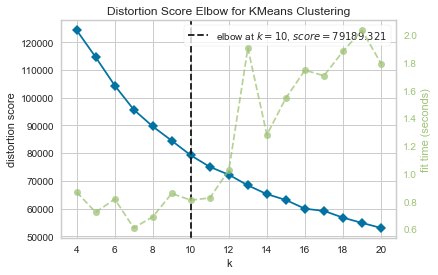

Wall time: 23.8 s


In [11]:
%%time
# Elbow method
model = KMeans(random_state=0)
visualizer = KElbowVisualizer(model, k=(4,21))

visualizer.fit(features_n)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

We first use the **"elbow" method** to select the optimal number of clusters. In our case, we see a smooth curve instead of a line chart that resembles an arm. This means the data is not very clustered. Even if the algorithm returns K = 10, the optimal value of K is actually unclear. 

Moreover, the skewed graph does not always give the correct answer. In our case, there are lots of duplicate data then there is the possibility that the elbow method may not give proper output. In the case of overlapping data, the **`silhouette coefficient`** works better, since it identifies the duplicate data.

### Sihouette score


Wall time: 3min 27s


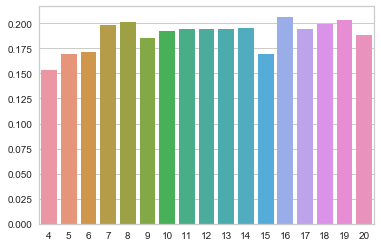

In [12]:
%%time
# Sihouette scores
ss_scores = {}
for num in tqdm(range(4, 21)):
    kmeans = KMeans(n_clusters=num, random_state=0).fit(features_n)
    ss_scores[num] = silhouette_score(features_n, kmeans.labels_, metric = 'euclidean')
sns.barplot(list(ss_scores.keys()), list(ss_scores.values()))

In [13]:
# Sihouette scores
ss_scores

{4: 0.1530785804390933,
 5: 0.16893523915003592,
 6: 0.1712799977476236,
 7: 0.19823294957407778,
 8: 0.20113938668115144,
 9: 0.18552507631222262,
 10: 0.19218434803594475,
 11: 0.19389200810515791,
 12: 0.19466194303288598,
 13: 0.19445841946846795,
 14: 0.19565546653664115,
 15: 0.1698437081475503,
 16: 0.2065498521101433,
 17: 0.19428324100128325,
 18: 0.19922577913976186,
 19: 0.2036003928751519,
 20: 0.18820904571855626}

Silhouette score for a set of sample data points is used to measure how dense and well-separated the clusters are. It takes into consideration the intra-cluster distance between the sample and other data points within the same cluster (a) and inter-cluster distance between the sample and the next nearest cluster (b).

The silhouette score falls within the range [-1, 1]. The silhouette score of 1 means that the clusters are very dense and nicely separated. The score of 0 means that clusters are overlapping. The score of less than 0 means that data belonging to clusters may be wrong/incorrect.

The silhouette plots can be used to select the most optimal value of the K (no. of cluster) in K-means clustering.

The aspects to look out for in Silhouette plots are cluster scores below the average silhouette score, wide fluctuations in the size of the clusters, and also the thickness of the silhouette plot.

In our case, we choose to look at Silhouette plots based on clusters k = 8, 10, 16, and 19. K = 8, 16, and 19 generated the highest Silhouette scores all above 0.2. k = 10 was choosen by the previous elbow method. 

Wall time: 4min 32s


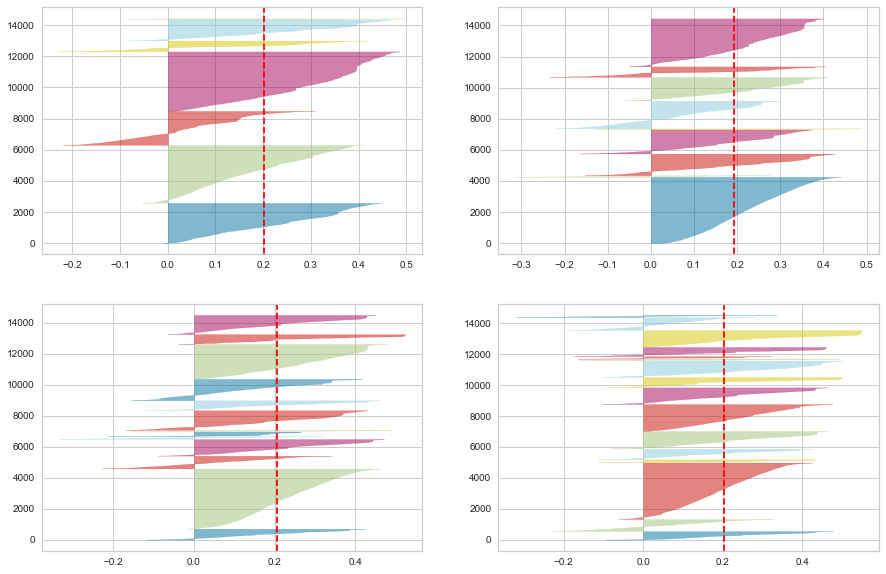

In [14]:
%%time
# make four Silhouette plots
fig, ax = plt.subplots(2, 2, figsize=(15,10))

lst = [0, 1, 8, 10, 16, 19]
for i in [2, 3, 4, 5]:
    
    # create KMeans instance for different number of clusters
    km = KMeans(n_clusters=lst[i], random_state=0)
    q, mod = divmod(i, 2)
    
    # create SilhouetteVisualizer instance with KMeans instance
    # fit the visualizer
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(features_n)

The following is our Silhouette analysis done on the above plots to select an optimal value for k (no. of cluster).

For all plots, the Silhouette score for each cluster is above average silhouete scores. However, the value of 8 and 10 for k have wide flucturation in the size of the silhouette plots. 

The value of 16 and 19 for k look to be the optimal one. The fluctuation in size is similar. The thickness of the Silhouette plot representing each cluster also is a deciding point. For the plot with k = 16 (bottom left), the thickness is more uniform than the plot with k = 19 (bottom right) with one cluster has large negative score. Thus, we can select the optimal number of clusters as 16 which also produces the highest Sihouette score.

### K-means fit

Once we decide to choose **k = 16**, we are going to compute cluster centers and predict cluster index for each merchant. 

In [15]:
# k = 16, fit K-means
kmeans = KMeans(n_clusters= 4 + np.argmax(np.array(list(ss_scores.values()))), random_state=0)
kmeans.fit(features_n)
features_n['label'] = kmeans.labels_
features_n.groupby(['label']).size()

label
0      702
1     3873
2      816
3     1066
4        1
5      169
6      281
7       95
8     1263
9        1
10       1
11     610
12    1374
13    2243
14     627
15    1229
dtype: int64

Our initial K-means fit produces three clusters which contains only one merchant in each. However, one type of business only has one merchant will not help us to make business decisions in real life environment. Therefore, we need to remove the three cluster centers (centroids) and re-fit k-means. The three merchants will be re-assigned to their nearest neighboring cluster. 

In [16]:
# find which cluster centers need to be removed
lst_rm = []
for i in range(len(features_n['label'].unique())):
    if features_n.groupby(['label']).size()[i] == 1:
        lst_rm.append(i)
lst_rm

[4, 9, 10]

In [17]:
# drop centroids
features_n = features_n.drop(['label'],1)

### K-means predict

Once we remove the centroids 4, 9 and 10, we re-fit kmeans to predict new label assignments for the three merchants. As a result of centroids removal, we have 13 groups to labelling all merchants.  

In [18]:
# re-fit k-means
if len(lst_rm) > 0:
    kmeans.cluster_centers_ = np.delete(kmeans.cluster_centers_, lst_rm, 0)
    new_label = kmeans.predict(features_n)
features_n['label'] = new_label
features_n.groupby(['label']).size()

label
0      702
1     3873
2      816
3     1066
4      171
5      281
6       96
7     1263
8      610
9     1374
10    2243
11     627
12    1229
dtype: int64

In [19]:
# check label column
features_n.head()

,daytime_n,evening_n,weekday_n,weekend_n,restaurant_n,quarter1_n,quarter2_n,quarter3_n,quarter4_n,median_spend_n,median_num_monthly_transactions_n,iqr_n,label
0,-0.020759,0.020759,-0.175131,0.175131,-0.203134,0.141525,-0.243151,0.059684,0.042987,-0.149175,0.400726,-0.035174,1
1,-0.616668,0.616668,-0.110741,0.110741,0.186147,1.378888,-0.489760,-0.843871,0.112085,-0.220640,-0.206096,-0.092117,7
2,-0.265920,0.265920,-0.209140,0.209140,-0.346379,0.202193,0.156565,0.102012,-0.345566,-0.270640,27.824800,-0.153615,6
3,-0.797161,0.797161,0.506958,-0.506958,0.089416,0.224267,0.001710,-0.058723,-0.109193,-0.238500,0.528478,-0.124166,1
4,0.594966,-0.594966,-0.204821,0.204821,0.191468,-0.555381,0.907315,0.661893,-0.861450,-0.023510,0.485894,0.104317,1


Here, we use T-distributed stochastic neighobr embedding (t-SNE) method to visualize our cluster assignment. 

T-SNE is a tool for visualizing high-dimensional data. It is a nonlinear dimensionality reduction technique to visualize data in a two dimensional space.

The following code is to project data into 2D with t-SNE and px.scatter. We use the t-SNE algorithm to display clusters.

In [20]:
%%time
#t-SNE plot
tsne = TSNE(n_components=2, random_state=0)
projections = tsne.fit_transform(features_n)

fig = px.scatter(
    projections, x=0, y=1, custom_data=[features_n[col] for col in features_n.columns],
    color=features_n['label'], labels={'color': 'label'}, title='t-SNE projection'
)
fig.update_traces(
    hovertemplate="<br>".join([
        col + ': %{customdata[' + str(i) + ']}' for i, col in enumerate(features_n.columns)
    ])
)
fig.show()

Wall time: 3min 32s
Parser   : 611 ms


The t-SNE plot shows label(cluster) assignment for each merchant at 2D level. **Based on the selected features, merchants seem to be well grouped into the final 13 groups.**

The column `label` is the label assignment from K-means. Each merchant has a label (0 to 12). 

In [21]:
# save out results
merchant_bucket_df['label'] = features_n['label']
merchant_bucket_df.to_csv('merchant_segmentation.csv', index=False)

## Part 2 - Define churn, identify churned merchants and predict churn 

First we define churn. The following code is to show % of merchants who have at least 1m+, 2m+, 3m+, 4m+, 5m+, 6m+ no activity after any transaction. We also calculate the re-activated rate for each time period for model development purpose. 

In [22]:
# our study ends on 2035-01-01 at 00:00:00
end_study_time = pd.Timestamp('2035-01-01 0:0:0')
data_end_study = pd.DataFrame({'merchant': data['merchant'].unique(),
                               'time': end_study_time})

# find out time difference between each transaction
df = pd.concat([data, data_end_study], ignore_index=True)
df = df.sort_values(['merchant','time'])
df['time_shifted'] = df.groupby(['merchant'])['time'].shift(1)
df['time_delta_in_month'] = (df['time'] - df['time_shifted'])/np.timedelta64(1, 'M')
df['time_delta_in_month'] = df['time_delta_in_month'].fillna(0)

# for month 1 to 6
for i in range(1,7):
    
    # find merchants that are reactivated and churned
    reactivated_churn = len(df.loc[df['time_delta_in_month']>=i]['merchant'].unique()) \
                     /len(data['merchant'].unique()) * 100
    
    # find merchants that are churned 
    churn_rate = len(df.loc[(df['time'] == end_study_time) & (df['time_delta_in_month']>=i)]['merchant'].unique()) \
                     /len(data['merchant'].unique()) * 100
    
    reactivated_rate = len(df.loc[(df['time'] != end_study_time) & (df['time_delta_in_month']>=i)]['merchant'].unique()) \
                     /len(data['merchant'].unique()) * 100
    
    print('{}% of merchants who have at least {} months or more no activities after any transaction.'.format(round(reactivated_churn,2), i))
    print('{}% of merchants who have at least {} months or more no activities after the last transaction.'.format(round(churn_rate,2), i))
    print('{}% of merchants have reactivated after {}-month gap.'.format(round(reactivated_rate, 2), i))
    print('-----------------------')

80.61% of merchants who have at least 1 months or more no activities after any transaction.
57.77% of merchants who have at least 1 months or more no activities after the last transaction.
49.52% of merchants have reactivated after 1-month gap.
-----------------------
67.02% of merchants who have at least 2 months or more no activities after any transaction.
47.56% of merchants who have at least 2 months or more no activities after the last transaction.
33.48% of merchants have reactivated after 2-month gap.
-----------------------
56.56% of merchants who have at least 3 months or more no activities after any transaction.
40.9% of merchants who have at least 3 months or more no activities after the last transaction.
23.84% of merchants have reactivated after 3-month gap.
-----------------------
48.67% of merchants who have at least 4 months or more no activities after any transaction.
35.8% of merchants who have at least 4 months or more no activities after the last transaction.
17.67%

Text(0, 0.5, 'Churn and Re-activated Rate %')

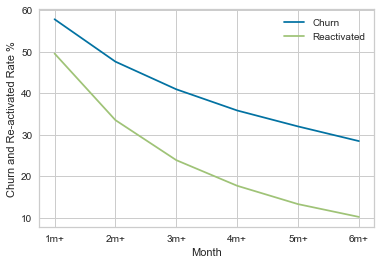

In [23]:
# plot churn rate and reactivated rate for merchants who have at least 1m+, 2m+, 3m+, 4m+, 5m+, 6m+ no activity after any transaction.
rate = pd.DataFrame({'Churn': [57.77, 47.56, 40.9, 35.8, 31.96, 28.43],
                     'Reactivated': [49.52, 33.48, 23.84, 17.67, 13.25, 10.17]})
rate.index = ['1m+', '2m+', '3m+', '4m+', '5m+', '6m+']

rate.plot()
plt.xlabel("Month")
plt.ylabel("Churn and Re-activated Rate %")

### Define churn:

**We define churn as a merchant who has at least 4 months or more no activity after the last transaction.** 4 months is approximately 120 days. This is a good threshold when the gap between churn rate and reactivated rate is widening. This is also reasonable given a relatively low reactivated rate (17.67%) and a little more than one third of merchants are churned. 


### Identify churned merchants: 
Next, we label merchants with 4m+ no transaction since the last transaction as churn merchants, others no-churn merchants. **Column `churn` is a binary variable indicating churn merchants.** 

In [24]:
# find churned merchant
churn_id = pd.DataFrame({'merchant':df.loc[(df['time']==end_study_time)&(df['time_delta_in_month']>=4)]['merchant'].unique()})
churn_id['churn'] = 1

# find reactivated merchant for model development
reactivated_id = pd.DataFrame({'merchant':df.loc[(df['time']!=end_study_time)&(df['time_delta_in_month']>=4)]['merchant'].unique()})
reactivated_id['reactivated'] = 1

# merge chured and reactivated merchants with the previous merchant clustering data
churn_df = pd.merge(merchant_bucket_df, churn_id, on = 'merchant', how = 'left')
churn_df['churn'] = churn_df['churn'].fillna(0)

churn_df = pd.merge(churn_df, reactivated_id, on = 'merchant', how = 'left')
churn_df['reactivated'] = churn_df['reactivated'].fillna(0)

# drop column label since it will not be used in model development
churn_df.drop('label', axis=1, inplace=True)
churn_df.head()

,merchant,daytime,evening,weekday,weekend,restaurant,quarter1,quarter2,quarter3,quarter4,median_spend,median_num_monthly_transactions,iqr,tenure_in_month,churn,reactivated
0,faa029c6b0,0.356618,0.643382,0.863971,0.136029,0.279412,0.180147,0.134191,0.273897,0.411765,145.990,30.0,150.4200,16.754855,0.0,0.0
1,ed7a7d91aa,0.187500,0.812500,0.875000,0.125000,0.375000,0.500000,0.062500,0.000000,0.437500,64.920,1.5,78.1025,12.918453,0.0,1.0
2,5608f200cf,0.287041,0.712959,0.858145,0.141855,0.244238,0.195829,0.250392,0.286728,0.267051,8.200,1318.0,0.0000,21.070087,0.0,0.0
3,15b1a0d61e,0.136276,0.863724,0.980806,0.019194,0.351248,0.201536,0.205374,0.238004,0.355086,44.660,36.0,37.4000,14.068934,0.0,0.0
4,4770051790,0.531359,0.468641,0.858885,0.141115,0.376307,0.000000,0.468641,0.456446,0.074913,288.545,34.0,327.5725,8.679853,0.0,0.0


In [25]:
# check missing or NaN
churn_df.isnull().values.any()

False

**Column churn is to identify merchants that have already churned.** 

We start churn model development in the following sections. First we perform exploratory data analysis. 

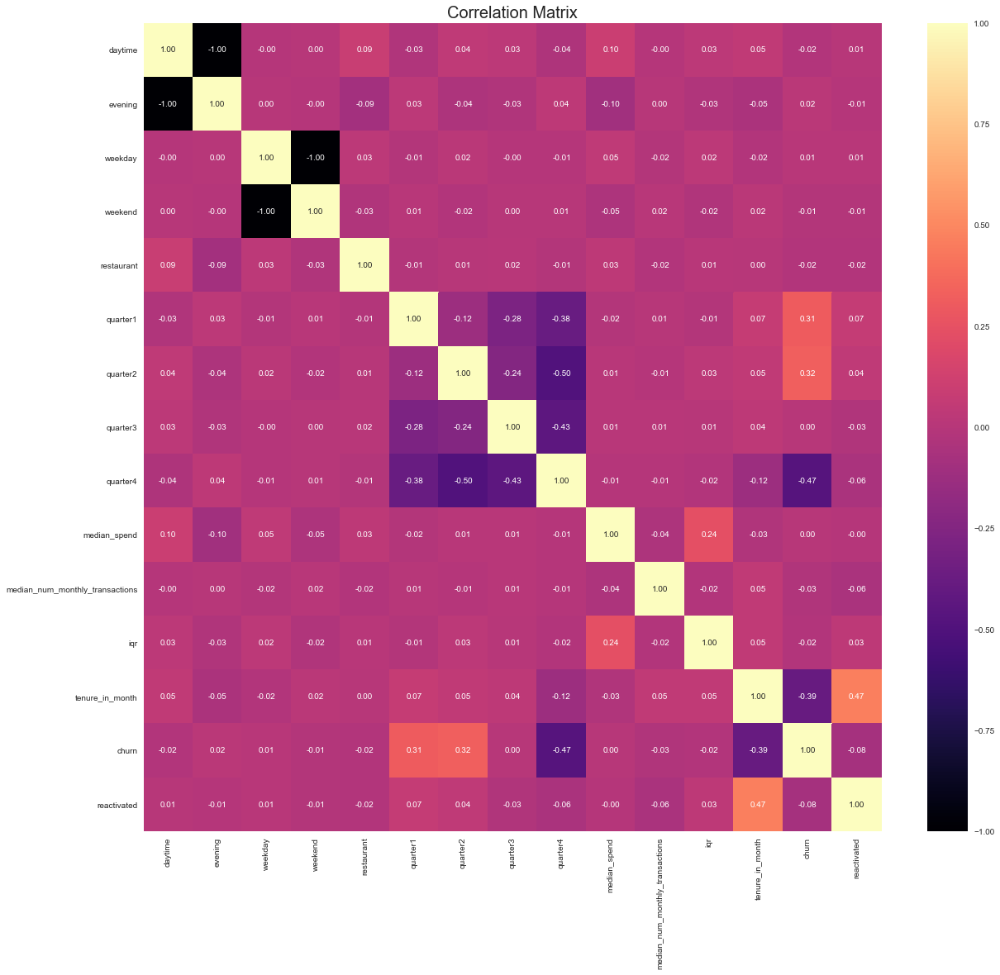

In [26]:
# If the correlation value is> 0, there is a positive correlation. While the value of one variable increases, the value of the other variable also increases.
# Correlation = 0 means no correlation.
# If the correlation is <0, there is a negative correlation. While one variable increases, the other variable decreases. 
# When the correlations are examined, there are 1 variables that act as a positive correlation to the exited dependent variable.

# Correlation Matrix
f, ax = plt.subplots(figsize= [20,18])
sns.heatmap(churn_df.corr(), annot=True, fmt=".2f", ax=ax, cmap = "magma" )
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

By our feature design, `weekday` and `weekend` are negatively correlated. Same goes to `daytime` and `evening`. Other correlation coefficients show relatively reasonable numbers (not too close to 1). 

The following pie chart shows 35.7% of merchants are churned.

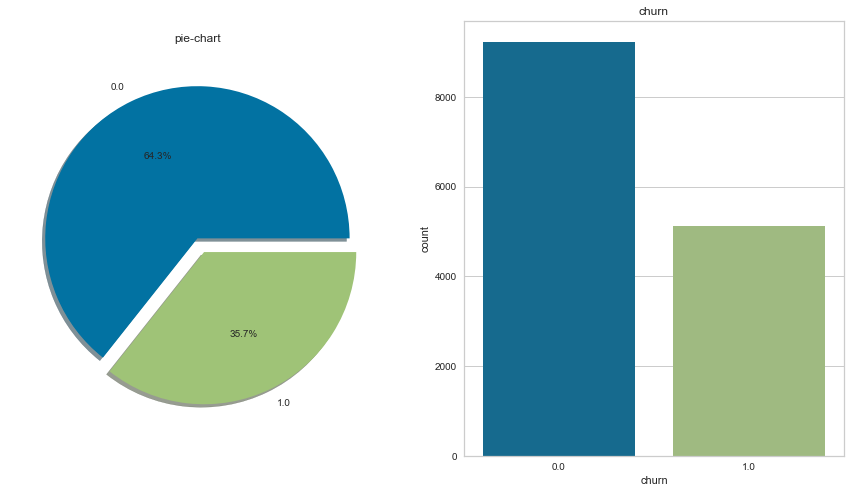

In [27]:
# The distribution of the dependent variable in the dataset is plotted as pie and columns graphs.
f,ax=plt.subplots(1,2,figsize=(15,8))
churn_df['churn'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('pie-chart')
ax[0].set_ylabel('')
sns.countplot('churn',data=churn_df,ax=ax[1])
ax[1].set_title('churn')
plt.show()

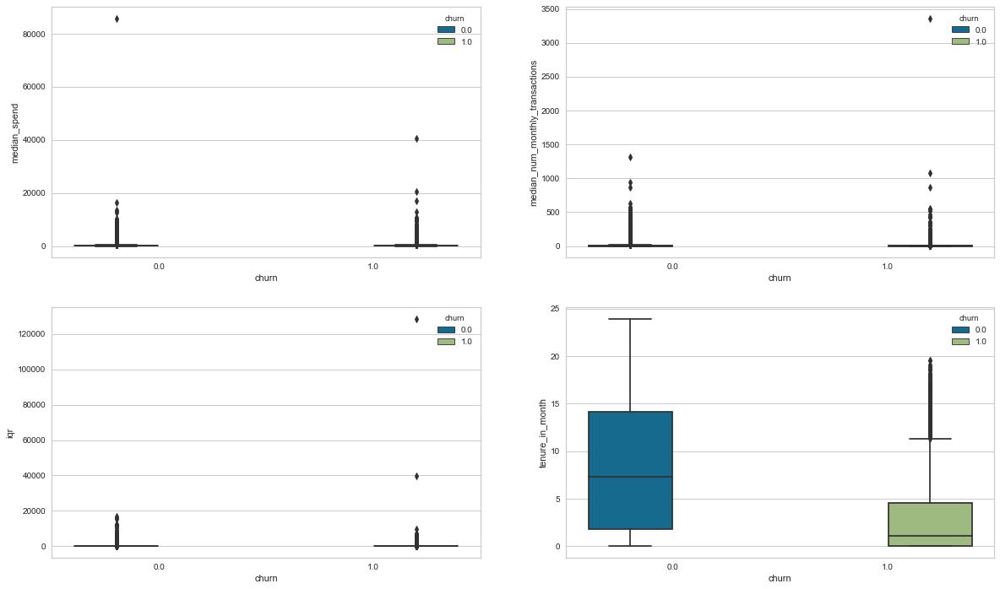

In [28]:
# Plotted the categorical variables on the basis of the graph of the column according to the dependent variable.
# Boxplot graph can also be used to spot outliers
fig, axarr = plt.subplots(2, 2, figsize=(20, 12))
sns.boxplot(y='median_spend',x = 'churn', hue = 'churn', data = churn_df, ax=axarr[0][0])
sns.boxplot(y='median_num_monthly_transactions',x = 'churn', hue = 'churn', data = churn_df , ax=axarr[0][1])
sns.boxplot(y='iqr',x = 'churn', hue = 'churn', data = churn_df, ax=axarr[1][0])
sns.boxplot(y='tenure_in_month',x = 'churn', hue = 'churn', data = churn_df , ax=axarr[1][1])

### Churn prediction model:

First, we separate response as y and predictors as X.

In [29]:
# separate response as y and predictors as X.
y = churn_df['churn']
X = churn_df.drop(['churn', 'merchant'], axis = 1)
cols = X.columns
index = X.index

Since we see outliers from the boxplots, we would like to use **RobustScaler** method (instead of StandardScaler) that is based on percentiles and are therefore not influenced by a few number of outliers. Note that the outliers themselves are still present in the transformed data.

In [30]:
# Feature scaling
transformer = RobustScaler().fit(X)
X = transformer.transform(X)
X = pd.DataFrame(X, columns = cols, index = index)

#check dimensions
print(X.shape, y.shape)

(14351, 14) (14351,)


Generate training and test datasets of response and predictors. Use 80% data as training data, and 20% data as validate data.

In [31]:
# Train-Test separation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(11480, 14) (2871, 14) (11480,) (2871,)


We use **SMOTE-Tomek Links** to handel the imbalanced data. We want the machine learning model to learn both the majority class as well as the minority class. 

In [32]:
# Because it's an imbalanced data set, we're going to increase the number of samples.
# References: https://towardsdatascience.com/imbalanced-classification-in-python-smote-tomek-links-method-6e48dfe69bbc
smk = SMOTETomek()
# Oversample training data
X_train, y_train = smk.fit_resample(X_train, y_train)

# Oversample validation data
X_test, y_test = smk.fit_resample(X_test, y_test)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(14110, 14) (3430, 14) (14110,) (3430,)


### Model selection

In [33]:
# baseline classification algorithms - first iteration
models = []
models.append(('Logistic Regression', LogisticRegression(random_state = 0)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier(random_state = 0)))
models.append(('Random Forest', RandomForestClassifier(random_state = 0)))
models.append(('SVM', SVC(gamma='auto', random_state = 0)))
models.append(('XGBoost', GradientBoostingClassifier(random_state = 0)))
models.append(("LightGBM", LGBMClassifier(random_state = 0)))
models.append(("CatBoost", CatBoostClassifier(random_state = 0, verbose = False)))

# evaluate each model in turn
results = []
names = []

#### Accuracy score, Precision, Recall, F1 Score

In [34]:
# compute Accuracy score, Precision, Recall, F1 Score for each model
for name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        print(name, ' :')
        accuracy = accuracy_score(y_test, y_pred)
        print("Accuracy_score: {}".format(accuracy))
        print("F1 Score: {}".format(f1_score(y_test, y_pred)))
        print("Precision: {}".format(precision_score(y_test, y_pred)))
        print("Recall: {}".format(recall_score(y_test, y_pred)))
        print("-------------------")

Logistic Regression  :
Accuracy_score: 0.8408163265306122
F1 Score: 0.8355421686746988
Precision: 0.8641744548286604
Recall: 0.8087463556851312
-------------------
KNN  :
Accuracy_score: 0.7991253644314869
F1 Score: 0.7921568627450981
Precision: 0.820625
Recall: 0.7655976676384839
-------------------
CART  :
Accuracy_score: 0.8379008746355685
F1 Score: 0.8356973995271868
Precision: 0.8472139005392451
Recall: 0.8244897959183674
-------------------
Random Forest  :
Accuracy_score: 0.8734693877551021
F1 Score: 0.8674404398289554
Precision: 0.9108402822322001
Recall: 0.8279883381924198
-------------------
SVM  :
Accuracy_score: 0.8542274052478134
F1 Score: 0.851190476190476
Precision: 0.8693009118541033
Recall: 0.8338192419825073
-------------------
XGBoost  :
Accuracy_score: 0.8918367346938776
F1 Score: 0.8881519445281881
Precision: 0.9194756554307116
Recall: 0.8588921282798834
-------------------
LightGBM  :
Accuracy_score: 0.8965014577259475
F1 Score: 0.8934253977784449
Precision: 0.920

LightGBM has the highest model accuracy score while KNN has the lowest. We want to pick one model that has the highest predictive power. We take a look at the confusion matrix for each model. 

In [35]:
# generate classification and confusion matrix for each model
for name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        print(name)
        print('Classification report:')
        print('-------------------')
        print(classification_report(y_test, y_pred))
        print('-------------------')
        print('Confusion matrix:')
        print('-------------------')
        print(confusion_matrix(y_test, y_pred))
        print('=====================================================')

Logistic Regression
Classification report:
-------------------
              precision    recall  f1-score   support

         0.0       0.82      0.87      0.85      1715
         1.0       0.86      0.81      0.84      1715

    accuracy                           0.84      3430
   macro avg       0.84      0.84      0.84      3430
weighted avg       0.84      0.84      0.84      3430

-------------------
Confusion matrix:
-------------------
[[1497  218]
 [ 328 1387]]
KNN
Classification report:
-------------------
              precision    recall  f1-score   support

         0.0       0.78      0.83      0.81      1715
         1.0       0.82      0.77      0.79      1715

    accuracy                           0.80      3430
   macro avg       0.80      0.80      0.80      3430
weighted avg       0.80      0.80      0.80      3430

-------------------
Confusion matrix:
-------------------
[[1428  287]
 [ 402 1313]]
CART
Classification report:
-------------------
              prec

### k-fold cross-validation

Next we evaluate each model using k-fold cross-validation. Here we use 5-fold cross validation. This means that 20% of the data is used for testing. Our full data size is not huge, 5-fold CV usually generate pretty accurate results.  

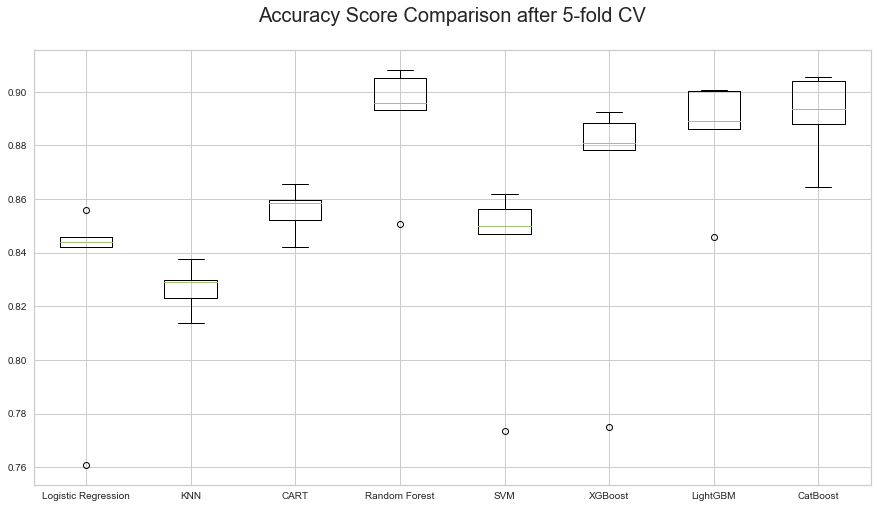

Wall time: 2min 28s


In [36]:
%%time
# k-fold cross validation
acc_results = []
names = []
# evaluate each model using k-fold cross-validation
for name, model in tqdm(models):
    kfold = model_selection.KFold(n_splits=5)  # 5-fold cross-validation
    cv_acc_results = model_selection.cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy') # accuracy score
    acc_results.append(cv_acc_results)
    names.append(name)
    
#Using Accuracy Mean:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(111)
plt.boxplot(acc_results)
ax.set_xticklabels(names)

plt.title('Accuracy Score Comparison after 5-fold CV\n',horizontalalignment="center", fontstyle = "normal", fontsize = "20", fontfamily = "sans-serif")
plt.xticks(rotation=0, horizontalalignment="center")
plt.yticks(rotation=0, horizontalalignment="right")
plt.show()

Based on the accuracy score for all of the models, we choose to focus on Random Forest, XGBoost, LightGBM and CatBoost bacause they have the highest average accuracy scores. 

### Feature importance

Next we list the variable importance for each model.

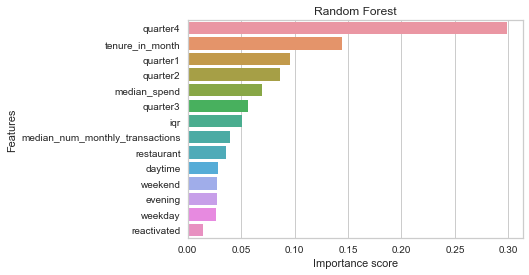

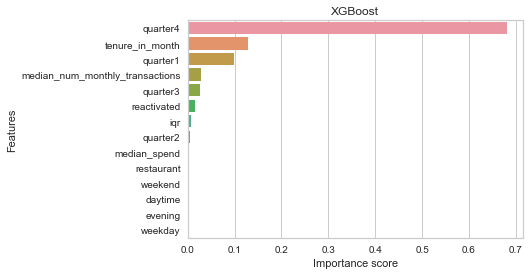

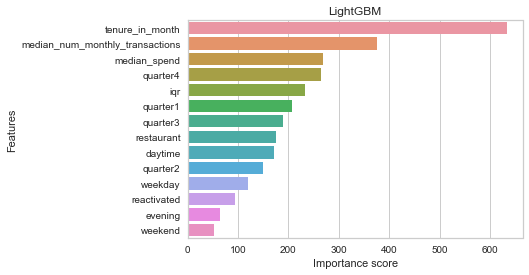

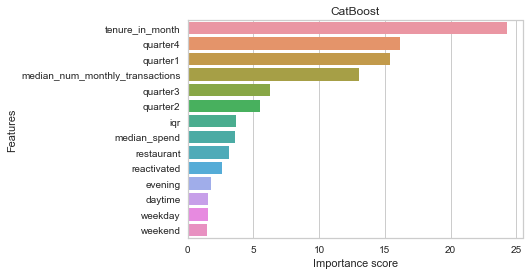

In [37]:
# feature importance
better_model = []
better_model.append(('Random Forest', RandomForestClassifier(random_state = 0)))
better_model.append(('XGBoost', GradientBoostingClassifier( random_state = 0)))
better_model.append(("LightGBM", LGBMClassifier(random_state = 0)))
better_model.append(("CatBoost", CatBoostClassifier(random_state = 0, verbose = False)))

for name, model in tqdm(better_model):
        base = model.fit(X_train,y_train)
        y_pred = base.predict(X_test)
        acc_score = accuracy_score(y_test, y_pred)
        feature_imp = pd.Series(base.feature_importances_, index=X.columns).sort_values(ascending=False)

        sns.barplot(x=feature_imp, y=feature_imp.index)
        plt.xlabel('Importance score')
        plt.ylabel('Features')
        plt.title(name)
        plt.show()

Feature importance charts show `quarter 4` and `tenure in month` are the two most relevant predictors to churn. 

### Hyperparameter tuning and model selection

Now we focus on hyperparameter turning to improve our model performance. To help illustrate, hyperparameters have previously been obtained with the help of GridSearchCV.

In [38]:
# Hyperparameters have previously been obtained with the help of GridSearchCV.
# Reference: https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# https://medium.com/analytics-vidhya/random-forest-classifier-and-its-hyperparameters-8467bec755f6
best_model = []
best_model.append(('Random Forest', RandomForestClassifier(random_state = 0, criterion = 'entropy', max_depth = 12, max_features = 'log2', min_samples_leaf = 1, min_samples_split = 5, n_estimators = 500)))
best_model.append(('XGBoost', GradientBoostingClassifier(random_state = 0,learning_rate = 0.05, max_depth = 5, min_samples_split = 2, n_estimators = 500, subsample = 0.8)))
best_model.append(("CatBoost", CatBoostClassifier(random_state = 0, verbose = False, depth = 10, iterations = 1000, l2_leaf_reg = 5, learning_rate = 0.01)))
best_model.append(("LightGBM", LGBMClassifier(random_state = 0,  learning_rate = 0.05, max_depth = 3, n_estimators = 1000)))

# evaluate each model in turn
results = pd.DataFrame()
names = []
for name, model in tqdm(best_model):
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        acc = accuracy_score(y_test, y_pred )
        prec = precision_score(y_test, y_pred )
        rec = recall_score(y_test, y_pred )
        f1 = f1_score(y_test, y_pred )
        f2 = fbeta_score(y_test, y_pred, beta=2.0)

        model_results = pd.DataFrame([[name, acc, prec, rec, f1, f2]],
               columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

        results = results.append(model_results)

results = results.sort_values(["Accuracy", "Precision", "Recall", "F1 Score"], ascending = False)
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,LightGBM,0.898542,0.922696,0.869971,0.895558,0.880028
0,XGBoost,0.894461,0.918885,0.865306,0.891291,0.875516
0,CatBoost,0.890087,0.920755,0.853644,0.885930,0.866272
0,Random Forest,0.883382,0.923920,0.835569,0.877526,0.851861


All four models generate similar performance. After considerating accuracy, precision, recall and F1-score, **we choose LightGBM as the final model to predict churn.** In our case, LightGBM has the highest F1 Score which means it reaches the optimal balance of recall and precision. 

### ROC and AUC

The following code produce the Receiver Operating Characteristic (ROC) curve and calculate the total Area Under the Curve (AUC), a metric that falls between zero and one with a higher number indicating better classification performance. 

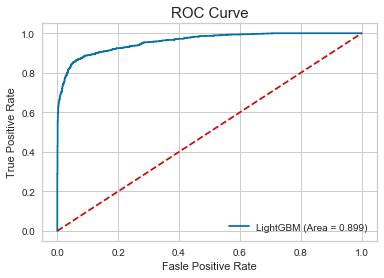

In [39]:
# evaluate the model using ROC
lgbm = best_model[-1][1]
y_pred_lgbm = lgbm.predict(X_test)
lgbm_roc_auc = roc_auc_score(y_test,y_pred_lgbm)
fpr, tpr, thresholds = roc_curve(y_test,lgbm.predict_proba(X_test)[:,1])
roc_auc = auc(fpr,tpr)

# plot ROC
plt.figure()
plt.plot(fpr, tpr, label='LightGBM (Area = {})'.format(round(lgbm_roc_auc,3)))
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05])
plt.xlabel('Fasle Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve', fontsize = 15)
plt.legend(loc="lower right")
plt.show()

In [40]:
# confusion matrix as a crosstab
confusion_matrix_lgbm = confusion_matrix(y_test,y_pred_lgbm)
confusion_matrix_lgbm

array([[1590,  125],
       [ 223, 1492]], dtype=int64)

In [41]:
# classification report
classify_lgbm = classification_report(y_test, y_pred_lgbm)
print(classify_lgbm)

              precision    recall  f1-score   support

         0.0       0.88      0.93      0.90      1715
         1.0       0.92      0.87      0.90      1715

    accuracy                           0.90      3430
   macro avg       0.90      0.90      0.90      3430
weighted avg       0.90      0.90      0.90      3430



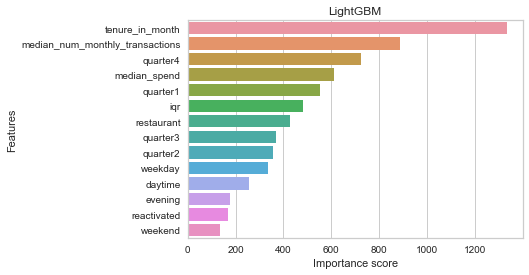

In [42]:
# feature importance
base = lgbm.fit(X_train,y_train)
feature_imp = pd.Series(base.feature_importances_, index=X.columns).sort_values(ascending=False)

sns.barplot(x=feature_imp, y=feature_imp.index)
plt.xlabel('Importance score')
plt.ylabel('Features')
plt.title(name)
plt.show()

### Part 2 conclusion:

The aim of this study is to create a model to predict whether a merchant will stop using the service. Our final model is based on LightGBM and it is chosen by the maximum accuracy score and F1 Score among all candidate models. 

With exploratory data analysis, we inherited features developed from feature generation in part one. Descriptive statistics of the dataset were examined. It was concluded that there were no missing observations in the dataset. However, we've seen outliers from the boxplots. 

We developed Logistic Regression, KNN, SVM, CART, Random Forests, XGBoost, LightGBM, CatBoost ML models. Accuracy score, Precision, Recall, F1-score, classification report and confusion matrix were all generated. We also evaluated each model by 5-fold cross validation. Later we checked Random Forests, XGBoost, LightGBM, CatBoost hyperparameter tuning to optimize the model performance. 

As the results from our analysis, the model based on LightGBM hyperparameter optimization became the winning model with the maximum AUC (0.898542). Features `tenure_in_month`, `median_num_monthly_transactions`, `quarter 4` and `median_spend` are most relevant to churn. 